In [1]:
"""
Object Detection (On Image) From TF2 Saved Model
=====================================
"""

import os
import xml.etree.ElementTree as ET
import numpy as np
import time
import glob
from IPython.display import display
from six import BytesIO
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings
%matplotlib inline 

In [2]:
# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = 'D:/Pemrograman/Python/Project/Hidup-Sehat-Machine-Learning/ObjectDetection/workspace/exported-models/03-my_model'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = 'D:/Pemrograman/Python/Project/Hidup-Sehat-Machine-Learning/ObjectDetection/workspace/annotations/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.6)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

Loading model...Done! Took 17.341285228729248 seconds


In [3]:
def load_image_into_numpy_array(path):
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy()
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = \
                            output_dict['detection_classes'].astype(np.int64)

  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

In [5]:
image_path_test = 'D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/'

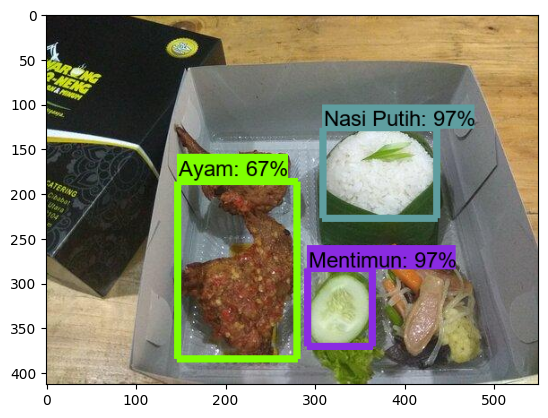

In [12]:
image_path = 'D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/nasiputihindonesia52.jpeg'
image_np = load_image_into_numpy_array(image_path)
output_dict = run_inference_for_single_image(detect_fn, image_np)
vis_util.visualize_boxes_and_labels_on_image_array(
  image_np,
  output_dict['detection_boxes'],
  output_dict['detection_classes'],
  output_dict['detection_scores'],
  category_index,
  instance_masks=output_dict.get('detection_masks_reframed', None),
  use_normalized_coordinates=True,
  line_thickness=8)
plt.imshow(Image.fromarray(image_np))

In [5]:
list_image_file = []
for file in os.listdir(image_path_test):    
    if file.split('.')[-1] != 'xml':
        list_image_file.append(file)

In [6]:
len(list_image_file)/8

85.75

In [7]:
random = np.random.randint(686,size=150)

D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/sunnysideegg88.jpeg
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/n07873807_10111.JPEG
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/n07753592_10800.JPEG
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/n07754684_11191.JPEG
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/makannasipaketempe4.jpeg
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/telordadarindonesia2.jpeg
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/whiterice86.jpeg
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/n07747607_10166.JPEG
D:/Pemrograman/Python/Project/google_image_scraper/Google-Image-Scraper/datasets/food/test/n07714571

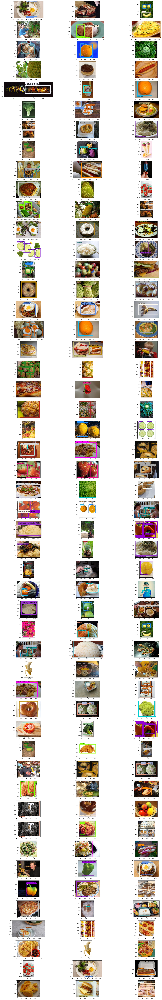

In [8]:
fig = plt.figure(figsize=(25 , 150),dpi=100)
for i, image_name in enumerate(np.array(list_image_file)[random]):
  ax = fig.add_subplot(50, 3, i + 1)
  # print('a')
  print(image_path_test+ image_name)
  image_np = load_image_into_numpy_array(image_path_test+ image_name)
  output_dict = run_inference_for_single_image(detect_fn, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.imshow(Image.fromarray(image_np))